In [1]:
import os
import pandas as pd
import json

In [13]:
if 1==0:
    lst = [i for i in os.listdir('/mnt/g/ig/post_summary/') if not i.startswith('.')]
    t = []
    for l in lst:
        print('/mnt/g/ig/post_summary/' + l)
        df = pd.read_csv('/mnt/g/ig/post_summary/' + l, lineterminator='\n')
        #df = pd.read_csv('/mnt/f/ig/post_summary/' + l)
        df['brand'] = l.split('.csv')[0]
        t.append(df)

    total_post = pd.concat(t)
    total_post.to_csv('/mnt/g/ig/total_posts_summary.csv', index=False)
else:
    total_post = pd.read_csv('/mnt/g/ig/total_posts_summary.csv')

In [14]:
total_post.shape

(975015, 11)

In [4]:
# get brands which have posts from 2021 until now
brands = [i.split('.')[0] for i in os.listdir('/mnt/e/erya/collab_posts_ig/id_2021_2024')]
len(brands)

205

In [16]:
total_post.columns

Index(['id', 'shortcode', 'create_date', 'caption', 'likes', 'comments',
       'affiliates', 'sponsored', 'ads', 'description', 'brand'],
      dtype='object')

In [17]:
files = [i for i in os.listdir('/mnt/g/ig/author_summary/') if not i.startswith('.')]
all = []
for f in files:
    df = pd.read_csv('/mnt/g/ig/author_summary/' + f)
    df['brand'] = f.split('/')[-1].split('.csv')[0]
    df['id'] = df.file.apply(lambda x: x.split('/')[-2])
    df['shortcode'] = df.file.apply(lambda x: x.split('/')[-1].split('_',1)[1].split('.json')[0])
    all.append(df)
total = pd.concat(all)
total_post['id'] = total_post['id'].astype('str')
total['id'] = total['id'].astype('str')
total_post['shortcode'] = total_post['shortcode'].astype('str')
total['shortcode'] = total['shortcode'].astype('str')
total_post['brand'] = total_post['brand'].astype('str')
total['brand'] = total['brand'].astype('str')
final = total_post.merge(total[['id', 'shortcode','brand','authors']], on = ['id', 'shortcode', 'brand'], how = 'left')
final['create_date'] = pd.to_datetime(final['create_date'], unit='s')
final_sub = final[final.create_date >= '2021-10-01']
final_sub['week_num'] = ((final_sub['create_date'] - pd.to_datetime('2021-10-01')).dt.days/7).astype(int)
final_sub.reset_index(drop = True, inplace = True)

/tmp/ipykernel_3461/401825698.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_sub['week_num'] = ((final_sub['create_date'] - pd.to_datetime('2021-10-01')).dt.days/7).astype(int)


In [18]:
final_sub.shape

(234750, 13)

In [19]:
final_sub.authors.unique()

array([ 1.,  0.,  2.,  3.,  4., nan,  5.])

In [ ]:
# The following brands have missing value (they deleted the posts after the data was collected)
# nike 1
# ragandbone 26

In [20]:
final_sub[final_sub.authors.isnull()].shape # 42 posts that have beem deleted
final_sub = final_sub[~final_sub.authors.isnull()] # 234708 posts that are still available
final_sub['solo_author'] = final_sub['authors'].apply(lambda x: 1 if x == 0 else 0)

In [25]:
final_sub = final_sub.drop(columns=['affiliates', 'sponsored', 'ads'])
final_sub = final_sub.sort_values(['brand', 'create_date'])

In [30]:
final_sub.to_csv('/mnt/g/ig/data_did.csv', index=False)

In [27]:
final_sub.groupby(['brand','solo_author']).size()

brand          solo_author
abercrombie    0                57
               1              1355
acnestudios    0                 1
               1              1137
adidas         0               101
                              ... 
wrangler       1               637
ysl            1               770
zalesjewelers  0                12
               1               766
zimmermann     1              1144
Length: 388, dtype: int64

In [111]:
final_sub[final_sub.create_date <= '2021-11-01'].shape

(8587, 14)

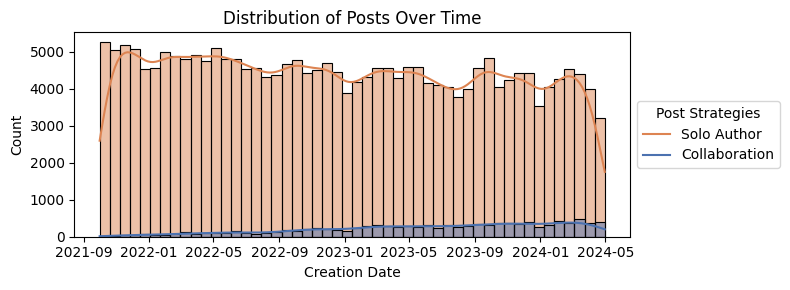

In [137]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set a color palette for better aesthetics
#sns.color_palette()
sns.set_palette('deep')
plt.subplots(figsize=(8, 3))
# Create the plot
g = sns.histplot(data=final_sub, x="create_date", hue="solo_author", kde=True, bins=50)

# Move legend outside the plot
plt.legend(title='Post Strategies', loc='center left', bbox_to_anchor=(1, 0.5), labels=['Solo Author', 'Collaboration'])

# Enhance plot aesthetics
plt.xlabel('Creation Date')
plt.ylabel('Count')
plt.title('Distribution of Posts Over Time')

# Adjust plot layout for legend
plt.tight_layout()

plt.show()

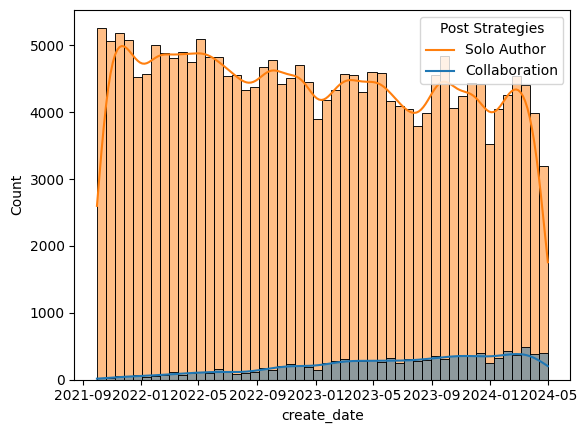

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt
g = sns.histplot(data=final_sub, x="create_date", hue="solo_author", kde=True, alpha=0.5, bins = 50)
plt.legend(title='Post Strategies', loc='upper right', labels=['Solo Author', 'Collaboration'])
plt.show(g)

<Axes: >

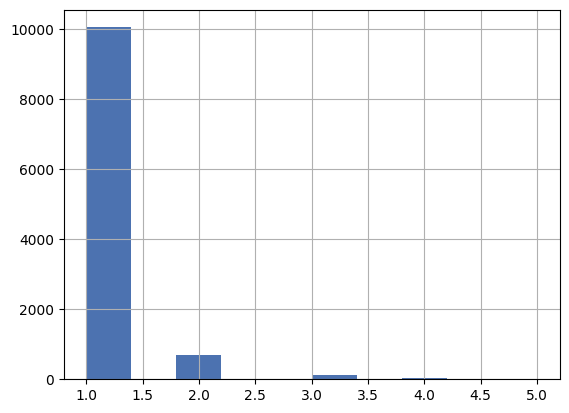

In [138]:
final_sub[final_sub.solo_author == 0].authors.hist()

In [63]:
import json
import os
import re
import time
from typing import Any, Dict, List, Optional, Union
from urllib.parse import quote_plus

import pandas as pd
import requests
from tqdm.notebook import tqdm
#from retry.api import retry_call
def output_json(brand, id, shortcode):

    os.chdir('/mnt/f/ig/')

    sf_api_key = "INhGdYFecrKghvYft3BTGPQxYgP27oobSIaM74zvehIWJWuAEKhkXVE3dVpWgaFjBx90YDwaVxPFyRyUTO"

    def request_json(url, params) -> Dict[str, Any]:
        response = requests.get(url, params=params, timeout=110)
        response.raise_for_status()
        return response.json()
    brands = [brand]
    for b in brands:
        print(b, brands.index(b))
        if os.path.exists('meta_new/{}'.format(b)):
            print("Brand has existed")
        else:
            os.mkdir('meta_new/{}'.format(b))
        # with open('/Volumes/erya/ig/meta_new/' + b + '.json', 'r') as f:
        #     id_sc_list = json.load(f)
        # for i in id_sc_list:
        #     print(i, id_sc_list.index(i))
        #     sc = i.split('/')[-1].split('_',1)[1].split('.')[0]
        #     id = i.split('/')[-2]
        id = id
        # if os.path.exists('meta_new/{}/{}'.format(b,id)):
        #     print('Exist')
        #     #continue
        # else:
        #     os.mkdir('meta_new/{}/{}'.format(b,id)) 
        #     #print(sc)
        sc = shortcode
    
        variables = {
                "shortcode": sc,
                "child_comment_count": 0,
                "fetch_comment_count": 0,
                "parent_comment_count": 0,
                "has_threaded_comments": False,
            }
        params = {
                "api_key": sf_api_key,
                #"url": f"https://instagram.com/graphql/query/?query_id=17888483320059182&id={user_id}&first=24&after={end_cursor}",
                "url":f"https://www.instagram.com/graphql/query/?query_hash=b3055c01b4b222b8a47dc12b090e4e64&shortcode={variables['shortcode']}&child_comment_count={variables['child_comment_count']}&fetch_comment_count={variables['fetch_comment_count']}&parent_comment_count={variables['parent_comment_count']}&has_threaded_comments={variables['has_threaded_comments']}",
                #"url":f"https://instagram.com/graphql/query/?query_hash=56a7068fea504063273cc2120ffd54f3&id={user_id}&first=24&after={end_cursor}"
            }
        try:
            response_json = request_json(url="https://scraping.narf.ai/api/v1/", params=params)
            if response_json.getcode() == 200:
                break
        except:
            pass
        with open(f'/mnt/f/ig/meta_new/{b}/{id}/' +id+'_'+sc+'.json', 'w') as f:
            print(f'/mnt/f/ig/meta_new/{b}/{id}/' +id+'_'+sc+'.json')
            json.dump(response_json, f)

In [71]:
output_json('ragandbone','3170134053608938333','Cv-lCAruttd')

ragandbone 0
Brand has existed
/mnt/f/ig/meta_new/ragandbone/3170134053608938333/3170134053608938333_Cv-lCAruttd.json


In [77]:
temp[temp.brand == 'ragandbone'].shape

(26, 13)

In [65]:
t = temp[temp.brand == 'nike'][1:]
for index, row in t.iterrows():
    id_value = row['id']
    shortcode_value = row['shortcode']
    brand_value = row['brand']
    # Do something with the values
    print(f"ID: {id_value}, Shortcode: {shortcode_value}, Brand: {brand_value}")
    # if os.path.exists('/mnt/f/ig/meta_new/{}/{}/{}_{}.json'.format(brand_value, id_value, id_value, shortcode_value)):
    #     print('Exists')
    # else:
    output_json(brand_value, id_value, shortcode_value)


ID: 3070658887965147874, Shortcode: CqdK_1TjwLi, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/3070658887965147874/3070658887965147874_CqdK_1TjwLi.json
ID: 3107914566000965427, Shortcode: Cshh9TSv_cz, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/3107914566000965427/3107914566000965427_Cshh9TSv_cz.json
ID: 3127977106310827700, Shortcode: Ctozpr_Ng60, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/3127977106310827700/3127977106310827700_Ctozpr_Ng60.json
ID: 2795998045112964919, Shortcode: CbNYWh_pRc3, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/2795998045112964919/2795998045112964919_CbNYWh_pRc3.json
ID: 3018537937464980813, Shortcode: CnkAELfo_VN, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/3018537937464980813/3018537937464980813_CnkAELfo_VN.json
ID: 3253391890580295939, Shortcode: C0mXq_xLNED, Brand: nike
nike 0
Brand has existed
/mnt/f/ig/meta_new/nike/3253391890580295939/3253391890580295939_C0mXq_xLNED.jso

In [127]:
with open('/mnt/f/ig/meta/alexandermcqueen/1528456621021077308/1528456621021077308_BU2KzLejh88.json', 'r') as f:
    df = json.load(f)

In [72]:
temp

,id,shortcode,create_date,caption,likes,comments,affiliates,sponsored,ads,description,brand,authors,week_num
336,3148722357778034639,Cuygk0_sK_P,2023-07-17 07:00:01,NaN,168751.0,1157.0,NaN,NaN,NaN,A slippery banana peel. A 24-year nap. And a f...,nike,NaN,93
10197,2856322145426436549,CejsduaOXHF,2022-06-08 20:30:23,NaN,7677.0,48.0,NaN,NaN,NaN,Nude perfection for every complexion 💄🤎. @isha...,maccosmetics,NaN,35
11177,2750310725237348559,CYrEQhnuBjP,2022-01-13 14:03:29,NaN,5564.0,20.0,NaN,NaN,NaN,You call it crazy…we call it everyday ⚡. #MACC...,maccosmetics,NaN,14
11652,2980878619396503241,CleNU-br3bJ,2022-11-27 17:00:47,NaN,3133.0,25.0,NaN,NaN,NaN,Add a touch of opulence to your complexion wit...,maccosmetics,NaN,60
21888,3347723336321539831,C51gKMrux73,2024-04-16 20:41:54,NaN,-1.0,44.0,NaN,NaN,NaN,be the princess that slays her own dragons!!!\...,aliceandolivia,NaN,132
21896,3355426514802465044,C6Q3qMsulkU,2024-04-27 11:44:28,NaN,-1.0,12.0,NaN,NaN,NaN,all the outfit ways to get your #SouthWestSumm...,aliceandolivia,NaN,134
54863,3351160664659078910,C6Btt6KRC7-,2024-04-21 14:25:06,"Photo by Brooks Brothers on April 21, 2024. Ma...",-1.0,7.0,NaN,NaN,NaN,Vintage tennis knits you will “love”.,brooksbrothers,NaN,133
78705,2793769658811594385,CbFdrPhuraR,2022-03-14 13:08:37,NaN,190467.0,284.0,NaN,NaN,NaN,Did someone say @hoooooyeony? 📍Here in Modern ...,calvinklein,NaN,23
89541,2674540715943660619,CUd4JxfJAxL,2021-10-01 01:04:58,NaN,1796.0,6.0,NaN,NaN,NaN,🅽🅴🆆 𝚂𝚃𝙾𝚁𝙴 𝙾𝙿𝙴𝙽𝙸𝙽𝙶 𝙫𝙞𝙨𝙞𝙩 with @twntysomethingyr...,forever21,NaN,0
89629,3049997314692530341,CpTxGXsJMCl,2023-03-03 01:50:11,NaN,2189.0,41.0,NaN,NaN,NaN,So much fun attending the @Forever21 X Rolling...,forever21,NaN,74


In [69]:
temp = final_sub[final_sub.authors.isnull()]
temp.groupby('brand').size()

brand
aliceandolivia     2
brooksbrothers     1
calvinklein        1
fentybeauty        1
forever21          3
fossil             1
goodamerican       1
hugo_official      1
kyliecosmetics     1
maccosmetics       3
nike               1
nyxcosmetics       1
ragandbone        26
veja               1
vincecamuto        1
dtype: int64

In [70]:
temp = final_sub[final_sub.authors.isnull()][2:]
for index, row in temp.iterrows():
    id_value = row['id']
    shortcode_value = row['shortcode']
    brand_value = row['brand']
    # Do something with the values
    print(f"ID: {id_value}, Shortcode: {shortcode_value}, Brand: {brand_value}")
    if os.path.exists('/mnt/f/ig/meta_new/{}/{}/{}_{}.json'.format(brand_value, id_value, id_value, shortcode_value)):
        print('Exists')
    else:
        output_json(brand_value, id_value, shortcode_value)

ID: 2693806930988627305, Shortcode: CViUyGfD_Vp, Brand: anastasiabeverlyhills
Exists
ID: 2844529158448904265, Shortcode: Cd5zDLalnhJ, Brand: anastasiabeverlyhills
Exists
ID: 2907012950612771620, Shortcode: ChXyOBmvAMk, Brand: anastasiabeverlyhills
Exists
ID: 3017054498356353752, Shortcode: CneuxTKhlrY, Brand: anastasiabeverlyhills
Exists
ID: 3038799490178742349, Shortcode: Cor_Ak7vfhN, Brand: anastasiabeverlyhills
anastasiabeverlyhills 0
Brand has existed
Exist
/mnt/f/ig/meta_new/anastasiabeverlyhills/3038799490178742349/3038799490178742349_Cor_Ak7vfhN.json
ID: 3097627369402017959, Shortcode: Cr8-643vCin, Brand: anastasiabeverlyhills
anastasiabeverlyhills 0
Brand has existed
Exist
/mnt/f/ig/meta_new/anastasiabeverlyhills/3097627369402017959/3097627369402017959_Cr8-643vCin.json
ID: 3243459076506667409, Shortcode: C0DFNhyskmR, Brand: anastasiabeverlyhills
anastasiabeverlyhills 0
Brand has existed
Exist
/mnt/f/ig/meta_new/anastasiabeverlyhills/3243459076506667409/3243459076506667409_C0DFN

In [53]:

#temp.groupby(['brand'])[['id','shortcode']]


,id,shortcode,create_date,caption,likes,comments,affiliates,sponsored,ads,description,brand,authors,week_num
5984,3083823306294025950,CrL8PVRud7e,2023-04-18 17:53:27,NaN,1017.0,7.0,NaN,NaN,NaN,"If it’s not platforms, we don’t want it ✋ #ALD...",aldo_shoes,NaN,80
8947,2674536610660567915,CUd3OCJM0tr,2021-10-01 00:53:50,NaN,-1.0,34.0,NaN,NaN,NaN,when you miss a party but feel included in sar...,aliceandolivia,NaN,0
9665,3347723336321539831,C51gKMrux73,2024-04-16 20:41:54,NaN,-1.0,44.0,NaN,NaN,NaN,be the princess that slays her own dragons!!!\...,aliceandolivia,NaN,132
9673,3355426514802465044,C6Q3qMsulkU,2024-04-27 11:44:28,NaN,-1.0,12.0,NaN,NaN,NaN,all the outfit ways to get your #SouthWestSumm...,aliceandolivia,NaN,134
12149,3178751001823945025,CwdMTHFIiFB,2023-08-27 17:17:50,NaN,422.0,2.0,NaN,NaN,NaN,What happens on set doesn’t necessarily stay o...,allsaints,NaN,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...
185949,2772051415342080387,CZ4ThNGlWGD,2022-02-12 13:59:24,NaN,93992.0,1014.0,NaN,NaN,NaN,When advanced technology meets drive and deter...,nan,NaN,19
186014,2869167122739961677,CfRVEvwJR9N,2022-06-26 14:30:02,NaN,36143.0,221.0,NaN,NaN,NaN,Unique to the Explorer II is the fixed satin-f...,nan,NaN,38
186021,2882276768564423113,Cf_53M2pKnJ,2022-07-14 16:00:03,NaN,149350.0,1161.0,NaN,NaN,NaN,Like a hidden treasure. The radiant Datejust 3...,nan,NaN,40
222351,3117090865784615637,CtCIaCbtPLV,2023-06-03 15:30:09,NaN,2304.0,15.0,NaN,NaN,NaN,The Impala.​\n\nModel: @olympefilledhades \n#v...,veja,NaN,87


In [18]:
final_sub['authors'] = final_sub['authors'].fillna(0)

/tmp/ipykernel_16802/1191352638.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_sub['authors'] = final_sub['authors'].fillna(0)


In [37]:
treated_pairs = final_sub[final_sub.authors!=0] # 10845 pairs
control_pairs = final_sub[(final_sub.authors==0) & (final_sub.brand.isin(noncollab_brands))] # 15853 pairs

In [23]:
temp = final_sub.groupby('brand')['authors'].sum().reset_index().sort_values('authors', ascending = False)
noncollab_brands = temp[temp.authors == 0]['brand'].to_list() # 21 noncollab bransd
collab_brands = temp[temp.authors != 0]['brand'].to_list() # 184 colllab brands

In [36]:
final_sub.authors = final_sub.authors.fillna(0)

In [38]:
final_sub.authors.value_counts()

authors
0.0    293248
1.0     10001
2.0       684
3.0       127
4.0        25
5.0         8
Name: count, dtype: int64

<Axes: >

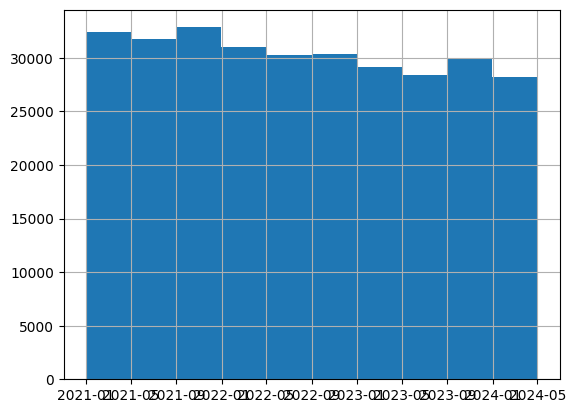

In [34]:
final_sub.create_date.hist()

### Aggregate features for each post

In [60]:
# for scene features
df = pd.read_csv('/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2500491554915674294_CKzh9IunOi2_scene.csv', skiprows=1)
video_duration = df["End Time (seconds)"][-1:].values[0]
scene_num = df['Scene Number'][-1:].values[0]
avg_scene_duration = df["Length (seconds)"].mean()

In [61]:
print(video_duration, scene_num, avg_scene_duration)

13.133 16 0.8207500000000001


In [72]:
all_videos =[]
for root, dir, file in os.walk('/mnt/e/erya/collab_posts_ig/video/scene/scene_list/'):
    for f in file:
        if f.endswith('.csv'):
            all_videos.append(os.path.join(root, f))
duration = []
scene_nums = []
avg_scene_box = []
for v in all_videos:
    print(v)
    try:
        df = pd.read_csv(v, skiprows=1)
        video_duration = df["End Time (seconds)"][-1:].values[0]
        scene_num = df['Scene Number'][-1:].values[0]
        avg_scene_duration = df["Length (seconds)"].mean()
        duration.append(video_duration)
        scene_nums.append(scene_num)
        avg_scene_box.append(avg_scene_duration)
    except:
        print('no_scene_detected')
        duration.append(0)
        scene_nums.append(0)
        avg_scene_box.append(0)
final_scene_stats = pd.DataFrame({'video':all_videos, 'duration':duration, 'scene_num':scene_nums, 'avg_scene_duration':avg_scene_box})
    #print(video_duration, scene_num, avg_scene_duration)


/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2485798105222242996_VDTVHGK0_1_scene.csv
no_scene_detected
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2486683295390001119_CKCeUg6nmff_1_scene.csv
no_scene_detected
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2490159168910863050_CKO0pIZHSrK_1_scene.csv
no_scene_detected
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2490159168910863050_CKO0pIZHSrK_2_scene.csv
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2490439764811965335_CKP0cVsH-OX_2_scene.csv
no_scene_detected
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2490483774913832475_CKP-cxSnOYb_scene.csv
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2500337371672778332_CKy-5eZMJZc_scene.csv
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/2500491554915674294_CKzh9IunOi2_scene.csv
/mnt/e/erya/collab_posts_ig/video/scene/scene_list/abercrombie/250247742226624749

In [74]:
final_scene_stats.to_csv('/mnt/e/erya/collab_posts_ig/aggregate_features/scene_stats.csv', index = False)

### Image Characteristics

In [87]:
import glob
all_images =[]
for file in glob.glob('/mnt/e/erya/collab_posts_ig/image/*/color/*.json'):
    all_images.append(file)
w = []
s = []
b = []
c = []
cl = []
for i in all_images:
    with open(i) as f:
        data = json.load(f)
        warm_hue = data['warm_hue']
        saturation = data['saturation']
        brightness = data['brightness']
        contrast = data['contrast']
        clarity = data['clarity']
        w.append(warm_hue)
        s.append(saturation)
        b.append(brightness)
        c.append(contrast)
        cl.append(clarity)
final_image_stats = pd.DataFrame({'image':all_images, 'warm_hue':w, 'saturation':s, 'brightness':b, 'contrast':c, 'clarity':cl})
    
    # for f in file:
    #     if f.endswith('.json'):
    #         all_images.append(os.path.join(root, f))

In [89]:
final_image_stats.to_csv('/mnt/e/erya/collab_posts_ig/aggregate_features/image_stats.csv', index = False)

### Nima Score

In [93]:
import glob
from progressbar import progressbar
all_images =[]
for file in glob.glob('/mnt/e/erya/collab_posts_ig/image/*/nima/*.json'):
    all_images.append(file)
n_mean = []
n_std = []
for i in progressbar(all_images):
    with open(i) as f:
        data = json.load(f)
        nima = data['score']
        nima_std = data['std']  
        n_mean.append(nima)
        n_std.append(nima_std)
final_nima_stats = pd.DataFrame({'image':all_images, 'nima':n_mean, 'nima_std':n_std})


  0% (0 of 449407) |                     | Elapsed Time: 0:00:00 ETA:  --:--:--
  0% (13 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:58:10
  0% (26 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:59:13
  0% (40 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:57:49
  0% (54 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:57:00
  0% (68 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:56:36
  0% (82 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:56:24
  0% (96 of 449407) |                    | Elapsed Time: 0:00:00 ETA:   0:56:12
  0% (110 of 449407) |                   | Elapsed Time: 0:00:00 ETA:   0:55:59
  0% (124 of 449407) |                   | Elapsed Time: 0:00:00 ETA:   0:55:55
  0% (138 of 449407) |                   | Elapsed Time: 0:00:01 ETA:   0:55:50
  0% (152 of 449407) |                   | Elapsed Time: 0:00:01 ETA:   0:55:51
  0% (166 of 449407) |                  

In [95]:
final_nima_stats.to_csv('/mnt/e/erya/collab_posts_ig/aggregate_features/nima_stats.csv', index = False)

### Clip score

In [105]:
import glob
from progressbar import progressbar
if 1==0:
    all_images =[]
    for file in glob.glob('/mnt/e/erya/collab_posts_ig/image/*/clip/*.json'):
        all_images.append(file)
    clip_box = []
    for i in progressbar(all_images):
        if 'failed' not in i:
            with open(i) as f:
                #print(i)
                data = json.load(f)
                clip = data['Similarity']
                clip_box.append(clip)
        else:
            pass
else:
    final_clip_stats = pd.DataFrame({'image':[i for i in all_images if 'failed' not in i], 'clip':clip_box})


In [107]:
final_clip_stats.to_csv('/mnt/e/erya/collab_posts_ig/aggregate_features/clip_stats.csv', index = False)

### Deepface features

In [118]:
import glob
from progressbar import progressbar
if 1==0:
    all_images =[]
    for file in glob.glob('/mnt/e/erya/collab_posts_ig/image/*/deepface/*.json'):
        all_images.append(file)
    faces_box = []
    age_box = []
    gender_box = []
    race_box = []
    emotion_box = []
    for i in progressbar(all_images):
        if 'failed' not in i:
            with open(i) as f:
                #print(i)
                data = json.load(f)
                num_faces = len(data)
                age = [i['age'] for i in data]
                gender = [i['dominant_gender'] for i in data]
                race = [i['dominant_race'] for i in data]
                emotion = [i['dominant_emotion'] for i in data]
                faces_box.append(num_faces)
                age_box.append(age)
                gender_box.append(gender)
                race_box.append(race)
                emotion_box.append(emotion)
        else:
            pass
else:
    final_deepface_stats = pd.DataFrame({'image':[i for i in all_images if 'failed' not in i], 
                                     'num_faces':faces_box, 
                                     'age':age_box, 
                                     'gender':gender_box,
                                     'race':race_box,
                                     'emotion':emotion_box})


In [120]:
final_deepface_stats.to_csv('/mnt/e/erya/collab_posts_ig/aggregate_features/deepface_stats.csv', index = False)

### Audio features

In [121]:
import pandas as pd
temp = pd.read_csv('/mnt/e/erya/collab_posts_ig/video/audio_features/abercrombie/2485798105222242996_VDTVHGK0_1.csv')

In [123]:
temp.columns.to_list()

['file',
 'start',
 'end',
 'pcm_intensity_sma_max',
 'pcm_intensity_sma_min',
 'pcm_intensity_sma_range',
 'pcm_intensity_sma_maxPos',
 'pcm_intensity_sma_minPos',
 'pcm_intensity_sma_amean',
 'pcm_intensity_sma_linregc1',
 'pcm_intensity_sma_linregc2',
 'pcm_intensity_sma_linregerrA',
 'pcm_intensity_sma_linregerrQ',
 'pcm_intensity_sma_stddev',
 'pcm_intensity_sma_skewness',
 'pcm_intensity_sma_kurtosis',
 'pcm_intensity_sma_quartile1',
 'pcm_intensity_sma_quartile2',
 'pcm_intensity_sma_quartile3',
 'pcm_intensity_sma_iqr1-2',
 'pcm_intensity_sma_iqr2-3',
 'pcm_intensity_sma_iqr1-3',
 'pcm_loudness_sma_max',
 'pcm_loudness_sma_min',
 'pcm_loudness_sma_range',
 'pcm_loudness_sma_maxPos',
 'pcm_loudness_sma_minPos',
 'pcm_loudness_sma_amean',
 'pcm_loudness_sma_linregc1',
 'pcm_loudness_sma_linregc2',
 'pcm_loudness_sma_linregerrA',
 'pcm_loudness_sma_linregerrQ',
 'pcm_loudness_sma_stddev',
 'pcm_loudness_sma_skewness',
 'pcm_loudness_sma_kurtosis',
 'pcm_loudness_sma_quartile1',
 '

In [108]:
with open('/mnt/e/erya/collab_posts_ig/image/abercrombie/deepface/2477101317363695547_CJgboYeHX-7_8.json','r') as f:
    data = json.load(f)

In [113]:
data[0]

{'age': 26,
 'region': {'x': 435, 'y': 313, 'w': 76, 'h': 76},
 'face_confidence': 12.892764201096725,
 'gender': {'Woman': 0.22758455015718937, 'Man': 99.77241158485413},
 'dominant_gender': 'Man',
 'race': {'asian': 0.0012373751249604244,
  'indian': 0.0009995372865784237,
  'black': 2.053432023878993e-05,
  'white': 97.66462473098937,
  'middle eastern': 1.2356960604255127,
  'latino hispanic': 1.0974189820982239},
 'dominant_race': 'white',
 'emotion': {'angry': 0.007768969953758642,
  'disgust': 2.1589166010471672e-07,
  'fear': 0.02121083380188793,
  'happy': 3.759712353348732,
  'sad': 0.32676830887794495,
  'surprise': 0.0008614162652520463,
  'neutral': 95.88367938995361},
 'dominant_emotion': 'neutral'}

In [116]:
[i['dominant_emotion'] for i in data]

['neutral', 'neutral']